In [40]:
import cv2
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import math

In [41]:
img = cv2.imread("data_raw/image/1/20224869_Head facing forward_27.551719198255583_51.jpg")

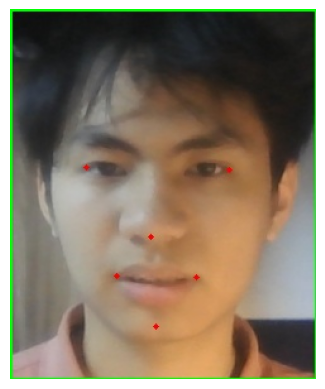

In [42]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(img) # RGB

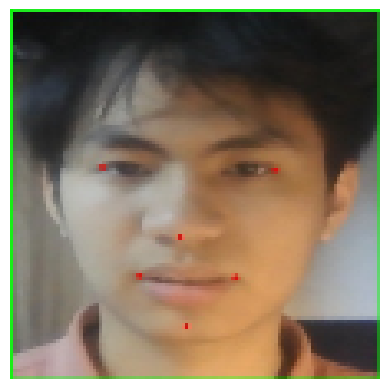

In [43]:
img = cv2.resize(img, (112, 112))
plt.axis('off')
plt.imshow(img)

In [44]:
class FaceLoading:
    def __init__(self,directory):
        self.directory = directory
        self.target_size = (112, 112)
        self.X = []
        self.y = []
    def extract_face(self,path):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        face = cv2.resize(img, self.target_size)
        return face
    def load_face_and_class(self):
        for sub_dir in os.listdir(self.directory):
            sub_dir_path = os.path.join(self.directory, sub_dir)
            for img_name in os.listdir(sub_dir_path):
                face = self.extract_face(os.path.join(sub_dir_path, img_name))
                self.X.append(face)
                self.y.append(sub_dir)
        return np.array(self.X), np.array(self.y)
    def plot_images(self):
        num_columns = 3
        num_rows = math.ceil(len(self.X) / num_columns)  # Ensure row count covers all images

        plt.figure(figsize=(num_columns * 3, num_rows * 3))  # Adjust figure size dynamically
        for num, img in enumerate(self.X):
            plt.subplot(num_rows, num_columns, num + 1)
            plt.imshow(img)
            plt.axis('off')
        plt.tight_layout()  # Improve layout spacing
        plt.show()


In [45]:
face_loading = FaceLoading(r"C:\Users\admin\OneDrive - Hanoi University of Science and Technology\Documents\GitHub\PTTK\face_recognization\source\data_raw\image")
X,y = face_loading.load_face_and_class()

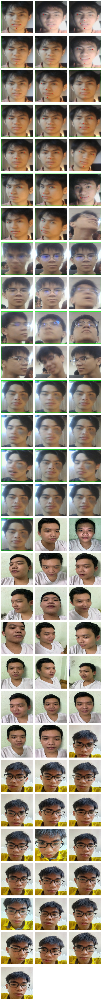

In [46]:
face_loading.plot_images()

In [47]:
len(y),print(y)

['1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1'
 '1' '1' '2' '2' '2' '2' '2' '2' '2' '2' '2' '2' '2' '2' '2' '3' '3' '3'
 '3' '3' '3' '3' '3' '3' '3' '3' '3' '3' '4' '4' '4' '4' '4' '4' '4' '4'
 '4' '4' '4' '4' '4' '4' '4' '4' '4' '4' '4' '5' '5' '5' '5' '5' '5' '5'
 '5' '5' '5' '5' '5' '5' '5' '5' '5' '5' '5' '5' '5']


(85, None)

In [48]:
from sklearn.preprocessing import LabelEncoder
encode =  LabelEncoder()
encoded_y = encode.fit_transform(y)

# **LOAD MODEL**

In [49]:
from tensorflow.keras.models import load_model, Model
model = load_model(r'C:\Users\admin\OneDrive - Hanoi University of Science and Technology\Documents\GitHub\PTTK\face_recognization\model\resnet50.h5')

In [50]:
model.summary()

Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 112, 112,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 118, 118,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1 (Conv2D)      │ (None, 56, 56,    │      9,472 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_conv1            │ (None, 56, 56,    │        256 │ conv1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_40       │ (None, 56, 56,    │          0 │ bn_conv1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_first_compon… │ (None, 28, 28,    │      4,160 │ activation_40[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_first_compone… │ (None, 28, 28,    │        256 │ res2a_first_comp… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_41       │ (None, 28, 28,    │          0 │ bn2a_first_compo… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_second_compo… │ (None, 28, 28,    │     36,928 │ activation_41[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_second_compon… │ (None, 28, 28,    │        256 │ res2a_second_com… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_42       │ (None, 28, 28,    │          0 │ bn2a_second_comp… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_third_compon… │ (None, 28, 28,    │     16,640 │ activation_42[0]… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_merge         │ (None, 28, 28,    │     16,640 │ activation_40[0]… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_third_compone… │ (None, 28, 28,    │      1,024 │ res2a_third_comp… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_merge          │ (None, 28, 28,    │      1,024 │ res2a_merge[0][0] │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_13 (Add)        │ (None, 28, 28,    │          0 │ bn2a_third_compo… │
│                     │ 256)              │            │ bn2a_merge[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_43       │ (None, 28, 28,    │          0 │ add_13[0][0]    

 Total params: 10,432,586 (39.80 MB)

 Trainable params: 10,401,992 (39.68 MB)

 Non-trainable params: 30,592 (119.50 KB)

 Optimizer params: 2 (12.00 B)

In [51]:
embedding_model = Model(inputs=model.input,
                        outputs=model.get_layer('flatten_1').output)

In [52]:
X_norm = X / 255.0

In [53]:
print(X_norm[0])

[[[0.01960784 0.98039216 0.        ]
  [0.10980392 0.92156863 0.11764706]
  [0.10588235 0.91372549 0.11372549]
  ...
  [0.12156863 0.91764706 0.12156863]
  [0.11372549 0.92156863 0.11764706]
  [0.05882353 0.96078431 0.07058824]]

 [[0.0745098  0.9372549  0.09019608]
  [0.04313725 0.09411765 0.05490196]
  [0.05882353 0.06666667 0.05490196]
  ...
  [0.11764706 0.11764706 0.11372549]
  [0.09803922 0.12941176 0.09411765]
  [0.12941176 0.47843137 0.1254902 ]]

 [[0.11372549 0.93333333 0.10196078]
  [0.04705882 0.08627451 0.03137255]
  [0.07843137 0.05490196 0.05490196]
  ...
  [0.12156863 0.11764706 0.10196078]
  [0.09803922 0.1254902  0.08627451]
  [0.11372549 0.49803922 0.11764706]]

 ...

 [[0.09411765 0.93333333 0.07843137]
  [0.62745098 0.59215686 0.51372549]
  [0.69019608 0.55686275 0.56078431]
  ...
  [0.29019608 0.21568627 0.18823529]
  [0.25098039 0.21568627 0.16078431]
  [0.13333333 0.54509804 0.1254902 ]]

 [[0.10196078 0.9372549  0.08627451]
  [0.65490196 0.61176471 0.5372549 ]


In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.2, stratify=y, random_state=42)


In [55]:
embeddings = []
labels = []

for img, label in zip(X_train, y_train):
    emb = embedding_model.predict(img[np.newaxis])[0]
    embeddings.append(emb)
    labels.append(label)

np.save('user_embeddings.npy', np.array(embeddings))
np.save('user_labels.npy', np.array(labels))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━

In [56]:
emb.shape

(9216,)

In [57]:
labels[:5]

['4', '1', '3', '2', '4']

In [58]:
from sklearn.metrics.pairwise import cosine_similarity

# Load embeddings và labels đã lưu
saved_embeddings = np.load('user_embeddings.npy')
saved_labels = np.load('user_labels.npy', allow_pickle=True)  # allow_pickle nếu label là string

# Dự đoán cho tập test
predicted_labels = []

for img in X_test:
    emb = embedding_model.predict(img[np.newaxis])[0]

    # Tính cosine similarity giữa emb và tất cả saved_embeddings
    similarities = cosine_similarity([emb], saved_embeddings)[0]

    # Tìm index embedding giống nhất
    best_idx = np.argmax(similarities)

    # Gán nhãn tương ứng
    predicted_label = saved_labels[best_idx]
    predicted_labels.append(predicted_label)

# Đánh giá độ chính xác nếu có y_test
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, predicted_labels)
print("Độ chính xác:", accuracy)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Độ chính xác: 0.9411764705882353
